# Project information

**Title:** Mapping cancer cell line dependencies to patient populations


**Authors:** Sinead Dunphy, Alyson Freeman, Kristina Garber

36-alysonkf-kgarb-dunphysi

**Notebook location:** https://drive.google.com/file/d/1cMrlVbIkz0rvb3GEDJeqs3odxHYaovei/view?usp=sharing

**Links to datasets:**

DepMap CRISPR dependencies data: https://ndownloader.figshare.com/files/29125323

DepMap RNAseq gene expression data: https://ndownloader.figshare.com/files/29124747

DepMap cell line metadata: https://ndownloader.figshare.com/files/29162481

TCGA RNAseq gene expression data: https://xenabrowser.net/datapages/?dataset=EB%2B%2BAdjustPANCAN_IlluminaHiSeq_RNASeqV2.geneExp.xena&host=https%3A%2F%2Fpancanatlas.xenahubs.net&removeHub=https%3A%2F%2Fxena.treehouse.gi.ucsc.edu%3A443

TCGA patient sample metadata: https://api.gdc.cancer.gov/data/1b5f413e-a8d1-4d10-92eb-7c4ae739ed81

TCGA study abbreviations and names: https://gdc.cancer.gov/resources-tcga-users/tcga-code-tables/tcga-study-abbreviations

Gene aliases: https://www.genenames.org/cgi-bin/download/custom?col=gd_app_sym&col=gd_prev_sym&col=gd_aliases&status=Approved&status=Entry%20Withdrawn&hgnc_dbtag=on&order_by=gd_app_sym_sort&format=text&submit=submit

In [1]:
import pandas as pd
import numpy as np
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import altair as alt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from IPython.display import display
import seaborn as sns
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Data prep - same as in Notebook 1

In [2]:
#Importing 1) primary CRISPR gene effect and 2) cell lines info data from DepMap
CRISPR_df = pd.read_csv("/content/drive/Shared drives/Milestone_I/CRISPR_gene_effect.csv")
cell_lines_df = pd.read_csv("/content/drive/Shared drives/Milestone_I/sample_info.csv")
cell_line_expression = pd.read_csv("/content/drive/Shared drives/Milestone_I/CCLE_expression.csv")

In [3]:
#resetting index to cell line DepMap ID
CRISPR_df.set_index('DepMap_ID', inplace=True)

In [4]:
CRISPR_df['max'] = CRISPR_df.max(axis=1)

In [5]:
#transpose the dataframe so can work with genes as the rows
CRISPR_transpose = CRISPR_df.drop(columns = ['max']).transpose()

In [6]:
#adding max and min column for the max and min of each row
CRISPR_transpose['max'] = CRISPR_transpose.max(axis=1)
CRISPR_transpose['min'] = CRISPR_transpose.min(axis=1)

In [7]:
#if max <0 for entire row, this means all cell lines are sensitive to the gene in question. 
#Creating a new df to investigate such cases
Panlethal = CRISPR_transpose.drop(CRISPR_transpose[CRISPR_transpose['max']>-1].index)

In [8]:
#if max <0 for entire row, this means all cell lines are sensitive to the gene in question. 
#Creating a new df to remove such cases
Not_Panlethal = CRISPR_transpose.drop(CRISPR_transpose[CRISPR_transpose['max']<-1].index)

In [9]:
#if min >0 for entire row, this means no cell lines are sensitive to the gene in question. 
#Creating a new df to drop such cases
Not_all_insensitive = Not_Panlethal.drop(Not_Panlethal[Not_Panlethal['min']>-1].index)

In [10]:
#we want to focus on genes where some cells are sensitive and some are insenstive. 
#We picked out these genes in the Not_all_insensitive df. Now transposing so genes are back in the columns
#and dropping the max and min colunms
Genes_longlist = Not_all_insensitive.drop(columns = ['max','min']).transpose()

In [11]:
#count the number of senstive (below -1 gene dependancy) cell lines per gene
Above_minus_1 = Genes_longlist[Genes_longlist<-1].count()

In [12]:
#changing series to dataframe
abv_df = pd.DataFrame({'gene':Above_minus_1.index,'sensitive count':Above_minus_1.values}).set_index('gene')
abv_df.head()

,sensitive count
gene,
AAAS (8086),1
AAMP (14),518
AARS (16),989
AARS2 (57505),11
AASDHPPT (60496),4


In [13]:
#getting percentage of sensitive cell lines per gene
abv_df['percent sensitive'] = (abv_df['sensitive count']/990)*100
abv_df['insensitive count']= 990 - (abv_df['sensitive count'])
abv_df['percent insensitive'] = (abv_df['insensitive count']/990)*100
abv_df.head()

,sensitive count,percent sensitive,insensitive count,percent insensitive
gene,,,,
AAAS (8086),1,0.101010,989,99.898990
AAMP (14),518,52.323232,472,47.676768
AARS (16),989,99.898990,1,0.101010
AARS2 (57505),11,1.111111,979,98.888889
AASDHPPT (60496),4,0.404040,986,99.595960


In [14]:
#pulling out genes where more that 50% of cell lines are sensitive
percent_50 = abv_df[abv_df['percent sensitive']>50]
print('shape: ',percent_50.shape)
percent_50.head()

shape:  (788, 4)


,sensitive count,percent sensitive,insensitive count,percent insensitive
gene,,,,
AAMP (14),518,52.323232,472,47.676768
AARS (16),989,99.898990,1,0.101010
ABCB7 (22),831,83.939394,159,16.060606
ABCE1 (6059),985,99.494949,5,0.505051
ABCF1 (23),588,59.393939,402,40.606061


In [15]:
#pulling out genes where more that 75% of cell lines are sensitive
percent_75 = abv_df[abv_df['percent sensitive']>75]
print('shape: ',percent_75.shape)
percent_75.head()

shape:  (607, 4)


,sensitive count,percent sensitive,insensitive count,percent insensitive
gene,,,,
AARS (16),989,99.898990,1,0.101010
ABCB7 (22),831,83.939394,159,16.060606
ABCE1 (6059),985,99.494949,5,0.505051
ACTL6A (86),947,95.656566,43,4.343434
ACTR10 (55860),849,85.757576,141,14.242424


In [16]:
#pulling out genes where less than 25% of cell lines are sensitive
percent_25 = abv_df[abv_df['percent sensitive']<25]
print('shape: ',percent_25.shape)
percent_25.head()

shape:  (2610, 4)


,sensitive count,percent sensitive,insensitive count,percent insensitive
gene,,,,
AAAS (8086),1,0.101010,989,99.898990
AARS2 (57505),11,1.111111,979,98.888889
AASDHPPT (60496),4,0.404040,986,99.595960
AATF (26574),83,8.383838,907,91.616162
ABCA5 (23461),1,0.101010,989,99.898990


In [17]:
#pulling out genes where between 5 and 25% of cell lines are sensitive
percent_5_25 = abv_df[abv_df['percent sensitive'].between(5,25)]
print('shape: ',percent_5_25.shape)
percent_5_25.head()

shape:  (433, 4)


,sensitive count,percent sensitive,insensitive count,percent insensitive
gene,,,,
AATF (26574),83,8.383838,907,91.616162
ACIN1 (22985),221,22.323232,769,77.676768
ACLY (47),54,5.454545,936,94.545455
ACO2 (50),229,23.131313,761,76.868687
ACTB (60),124,12.525253,866,87.474747


In [18]:
#pulling out genes where between 25 and 50% of cell lines are sensitive
percent_25_50 = abv_df[abv_df['percent sensitive'].between(25,50)]
print('shape: ',percent_25_50.shape)
percent_25_50.head()

shape:  (186, 4)


,sensitive count,percent sensitive,insensitive count,percent insensitive
gene,,,,
ABT1 (29777),310,31.313131,680,68.686869
ACTR1A (10121),338,34.141414,652,65.858586
ADSL (158),442,44.646465,548,55.353535
AHCTF1 (25909),295,29.797980,695,70.202020
AK6 (102157402),373,37.676768,617,62.323232


In [19]:
list_50_percent = percent_50.index.to_list()
list_75_percent = percent_75.index.to_list()
list_25_percent = percent_25.index.to_list()
list_5_25_percent = percent_5_25.index.to_list()
list_25_50_percent = percent_25_50.index.to_list()

In [20]:
print('List_50_percent #genes    : ',len(list_50_percent), ',    First 5 genes : ', list_50_percent[:4])
print('List_75_percent #genes    : ',len(list_75_percent), ',    First 5 genes : ', list_75_percent[:4])
print('List_25_percent #genes    : ',len(list_25_percent), ',   First 5 genes: ', list_25_percent[:4])
print('List_5_25_percent #genes  : ',len(list_5_25_percent), ',    First 5 genes : ', list_5_25_percent[:4])
print('List_25_50_percent #genes : ',len(list_25_50_percent), ',    First 5 genes : ', list_25_50_percent[:4])

List_50_percent #genes    :  788 ,    First 5 genes :  ['AAMP (14)', 'AARS (16)', 'ABCB7 (22)', 'ABCE1 (6059)']
List_75_percent #genes    :  607 ,    First 5 genes :  ['AARS (16)', 'ABCB7 (22)', 'ABCE1 (6059)', 'ACTL6A (86)']
List_25_percent #genes    :  2610 ,   First 5 genes:  ['AAAS (8086)', 'AARS2 (57505)', 'AASDHPPT (60496)', 'AATF (26574)']
List_5_25_percent #genes  :  433 ,    First 5 genes :  ['AATF (26574)', 'ACIN1 (22985)', 'ACLY (47)', 'ACO2 (50)']
List_25_50_percent #genes :  186 ,    First 5 genes :  ['ABT1 (29777)', 'ACTR1A (10121)', 'ADSL (158)', 'AHCTF1 (25909)']


# Investigating correlation between ICA1 expression levels and gene dependency from CRISPR df for eosphageal cell lines




In [21]:
#Checking the cell_lines df
cell_lines_df.head()

,DepMap_ID,cell_line_name,stripped_cell_line_name,CCLE_Name,alias,COSMICID,sex,source,Achilles_n_replicates,cell_line_NNMD,culture_type,culture_medium,cas9_activity,RRID,WTSI_Master_Cell_ID,sample_collection_site,primary_or_metastasis,primary_disease,Subtype,age,Sanger_Model_ID,depmap_public_comments,lineage,lineage_subtype,lineage_sub_subtype,lineage_molecular_subtype
0,ACH-000001,NIH:OVCAR-3,NIHOVCAR3,NIHOVCAR3_OVARY,OVCAR3,905933.0,Female,ATCC,NaN,NaN,NaN,NaN,NaN,CVCL_0465,2201.0,ascites,Metastasis,Ovarian Cancer,"Adenocarcinoma, high grade serous",60.0,SIDM00105,NaN,ovary,ovary_adenocarcinoma,high_grade_serous,NaN
1,ACH-000002,HL-60,HL60,HL60_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,NaN,905938.0,Female,ATCC,NaN,NaN,NaN,NaN,NaN,CVCL_0002,55.0,haematopoietic_and_lymphoid_tissue,Primary,Leukemia,"Acute Myelogenous Leukemia (AML), M3 (Promyelo...",35.0,SIDM00829,NaN,blood,AML,M3,NaN
2,ACH-000003,CACO2,CACO2,CACO2_LARGE_INTESTINE,"CACO2, CaCo-2",NaN,Male,ATCC,NaN,NaN,NaN,NaN,NaN,CVCL_0025,NaN,Colon,NaN,Colon/Colorectal Cancer,Adenocarcinoma,NaN,SIDM00891,NaN,colorectal,colorectal_adenocarcinoma,NaN,NaN
3,ACH-000004,HEL,HEL,HEL_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,NaN,907053.0,Male,DSMZ,2.0,-3.079202,Suspension,RPMI + 10% FBS,52.4,CVCL_0001,783.0,haematopoietic_and_lymphoid_tissue,NaN,Leukemia,"Acute Myelogenous Leukemia (AML), M6 (Erythrol...",30.0,SIDM00594,NaN,blood,AML,M6,NaN
4,ACH-000005,HEL 92.1.7,HEL9217,HEL9217_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,NaN,NaN,Male,ATCC,2.0,-2.404409,Suspension,RPMI + 10% FBS,86.6,CVCL_2481,NaN,bone_marrow,NaN,Leukemia,"Acute Myelogenous Leukemia (AML), M6 (Erythrol...",30.0,SIDM00593,NaN,blood,AML,M6,NaN


In [22]:
#pulling out the cells lines for eosphageal cancer
cell_lines_eosphageal = cell_lines_df[cell_lines_df['primary_disease']== 'Esophageal Cancer']

In [23]:
#Getting list of eosphageal cell lines
eosphageal_cell_line_list = cell_lines_eosphageal['DepMap_ID'].tolist()

In [24]:
#Renaming DepMap_ID column in the cell line expression df
cell_line_expression.rename(columns={"Unnamed: 0":"DepMap_ID"}, inplace=True)

In [25]:
#selecting the data for the ICA1 gene from the expression df
ICA1_expression = cell_line_expression[['DepMap_ID','ICA1 (3382)']].copy()
ICA1_expression.set_index('DepMap_ID',inplace=True)
ICA1_expression.rename(columns={'ICA1 (3382)':'ICA1_expression'}, inplace=True)
ICA1_expression.head()

,ICA1_expression
DepMap_ID,
ACH-001113,1.922198
ACH-001289,3.513491
ACH-001339,2.301588
ACH-001538,3.946731
ACH-000242,5.591859


In [26]:
#merging the ICA1 cell expression with the CRISPR df
CRISPR_w_ICA1 = pd.merge(CRISPR_df,ICA1_expression, 
                         how = 'inner',left_index = True,right_index = True)

In [27]:
#selecting just the cell lines from eosphageal cancer
CRISPR_w_ICA1_reset_index = CRISPR_w_ICA1.reset_index()
CRISPR_w_ICA1_eosphageal = CRISPR_w_ICA1_reset_index[CRISPR_w_ICA1_reset_index['DepMap_ID'].isin (eosphageal_cell_line_list)]

CRISPR_w_ICA1_eosphageal.set_index('DepMap_ID',inplace=True)

In [28]:
#running correlation between ICA1 expression levels and CRISPR gene dependancy levels

#Note ICA1 expression is in the final column so identified by CRISPR_w_ICA1_eosphageal.iloc[:,-1]
ICA1_CRISPR_corr_df = pd.DataFrame()

for gene in CRISPR_w_ICA1_eosphageal.columns[:-1]:
    corr = np.corrcoef(CRISPR_w_ICA1_eosphageal[gene], CRISPR_w_ICA1_eosphageal.iloc[:,-1])
    std = np.std(corr)
    
    df_2 = pd.DataFrame([gene, corr[0][1], std])
    ICA1_CRISPR_corr_df = pd.concat([ICA1_CRISPR_corr_df, df_2], axis=1)
     
ICA1_CRISPR_corr_df.head()

,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,A1BG (1),A1CF (29974),A2M (2),A2ML1 (144568),A3GALT2 (127550),A4GALT (53947),A4GNT (51146),AAAS (8086),AACS (65985),AADAC (13),AADACL2 (344752),AADACL3 (126767),AADACL4 (343066),AADAT (51166),AAED1 (195827),AAGAB (79719),AAK1 (22848),AAMDC (28971),AAMP (14),AANAT (15),AAR2 (25980),AARD (441376),AARS (16),AARS2 (57505),AARSD1 (80755),AASDH (132949),AASDHPPT (60496),AASS (10157),AATF (26574),AATK (9625),ABAT (18),ABCA1 (19),ABCA10 (10349),ABCA12 (26154),ABCA13 (154664),ABCA2 (20),ABCA3 (21),ABCA4 (24),ABCA5 (23461),ABCA6 (23460),...,ZRSR2 (8233),ZSCAN1 (284312),ZSCAN10 (84891),ZSCAN16 (80345),ZSCAN18 (65982),ZSCAN2 (54993),ZSCAN20 (7579),ZSCAN21 (7589),ZSCAN22 (342945),ZSCAN23 (222696),ZSCAN25 (221785),ZSCAN29 (146050),ZSCAN30 (100101467),ZSCAN31 (64288),ZSCAN32 (54925),ZSCAN4 (201516),ZSCAN5A (79149),ZSCAN5B (342933),ZSCAN9 (7746),ZSWIM1 (90204),ZSWIM2 (151112),ZSWIM3 (140831),ZSWIM4 (65249),ZSWIM5 (57643),ZSWIM6 (57688),ZSWIM7 (125150),ZSWIM8 (23053),ZUP1 (221302),ZW10 (9183),ZWILCH (55055),ZWINT (11130),ZXDA (7789),ZXDB (158586),ZXDC (79364),ZYG11A (440590),ZYG11B (79699),ZYX (7791),ZZEF1 (23140),ZZZ3 (26009),max
1,-0.280925,-0.155514,0.194315,-0.171227,-0.12199,-0.15567,-0.0747424,0.136149,-0.0149942,-0.101607,-0.197434,0.441726,0.0741704,NaN,0.274488,-0.106207,0.196392,-0.123395,0.0928247,0.170428,0.135013,-0.0650465,0.096396,0.0671061,-0.0519884,0.118711,-0.119995,NaN,-0.212004,0.123577,NaN,0.140057,-0.104905,0.0874886,0.0536512,-0.05332,0.156585,-0.200341,-0.321547,-0.301765,...,0.238266,NaN,0.39581,0.196112,-0.254684,0.0207978,-0.206593,0.120468,-0.198309,-0.179426,0.242192,-0.0951886,0.0930066,0.181209,0.269901,0.230173,-0.181264,-0.124049,-0.0223356,0.134905,0.0867245,0.367783,-0.167046,0.0126235,-0.0854739,-0.097429,0.0571419,-0.135088,0.00690292,0.0284027,0.167711,-0.295724,0.136034,-0.192223,0.15451,0.317434,-0.363224,-0.0849502,NaN,-0.294084
2,0.640463,0.577757,0.402842,0.585613,0.560995,0.577835,0.537371,0.431925,0.507497,0.550803,0.598717,0.279137,0.462915,NaN,0.362756,0.553103,0.401804,0.561697,0.453588,0.414786,0.432493,0.532523,0.451802,0.466447,0.525994,0.440645,0.559998,NaN,0.606002,0.438211,NaN,0.429972,0.552452,0.456256,0.473174,0.52666,0.421708,0.60017,0.660774,0.650882,...,0.380867,NaN,0.302095,0.401944,0.627342,0.489601,0.603296,0.439766,0.599155,0.589713,0.378904,0.547594,0.453497,0.409395,0.365049,0.384914,0.590632,0.562024,0.511168,0.432547,0.456638,0.316109,0.583523,0.493688,0.542737,0.548714,0.471429,0.567544,0.496549,0.485799,0.416145,0.647862,0.431983,0.596111,0.422745,0.341283,0.681612,0.542475,NaN,0.647042


In [29]:
# Transpose and name columns
ICA1_CRISPR_corr_df_transpose = ICA1_CRISPR_corr_df.T
ICA1_CRISPR_corr_df_transpose.rename(columns={0:'Gene', 1:'Correlation', 2:'St Dev'}, inplace=True)
ICA1_CRISPR_corr_df_transpose.head()

,Gene,Correlation,St Dev
0,A1BG (1),-0.280925,0.640463
0,A1CF (29974),-0.155514,0.577757
0,A2M (2),0.194315,0.402842
0,A2ML1 (144568),-0.171227,0.585613
0,A3GALT2 (127550),-0.12199,0.560995


In [30]:
#sorting to find highest correlations
ICA1_CRISPR_corr_df_transpose = ICA1_CRISPR_corr_df_transpose.sort_values(by='Correlation', ascending=False)
ICA1_CRISPR_corr_df_transpose.head()

,Gene,Correlation,St Dev
0,PKDCC (91461),0.638641,0.18068
0,RPS2 (6187),0.638469,0.180765
0,STOML2 (30968),0.634476,0.182762
0,DQX1 (165545),0.613137,0.193432
0,SFTPB (6439),0.605053,0.197474


In [31]:
#getting a list of the genes which were not all panlethal and which were not all insensitive
genes_spread = Genes_longlist.T.index.to_list()
genes_spread[:5]

['AAAS (8086)', 'AAMP (14)', 'AARS (16)', 'AARS2 (57505)', 'AASDHPPT (60496)']

In [32]:
#selecting these genes from the correlation database
ICA1_CRISPR_corr_spread = ICA1_CRISPR_corr_df_transpose[ICA1_CRISPR_corr_df_transpose['Gene'].isin(genes_spread)].copy()

In [33]:
ICA1_CRISPR_corr_spread['abs_corr'] = ICA1_CRISPR_corr_spread['Correlation'].abs()
ICA1_CRISPR_corr_spread.sort_values(by='abs_corr', ascending=False).head(10)

,Gene,Correlation,St Dev,abs_corr
0,PROX1 (5629),-0.679856,0.839928,0.679856
0,RPS2 (6187),0.638469,0.180765,0.638469
0,ANAPC13 (25847),-0.626884,0.813442,0.626884
0,CSF2RA (1438),-0.618739,0.80937,0.618739
0,SYS1 (90196),0.599763,0.200119,0.599763
0,NFU1 (27247),0.592016,0.203992,0.592016
0,PPA1 (5464),0.586053,0.206973,0.586053
0,AP2M1 (1173),-0.564941,0.782471,0.564941
0,PDCD2 (5134),0.564912,0.217544,0.564912
0,MTHFD1 (4522),-0.56489,0.782445,0.56489


# Waterfall plots of ICA1 expression and histology type

In [34]:
#Pulling out cell line name, primary disease and subtype from cell lines info dataset
Primary_disease_and_subtype = cell_lines_df[['DepMap_ID','stripped_cell_line_name','primary_disease','Subtype']]
Primary_disease_and_subtype.set_index('DepMap_ID',inplace=True)

In [35]:
#merging this into the CRISPR datset
CRISPR_w_disease =pd.merge(CRISPR_df,Primary_disease_and_subtype, how = 'left',left_index = True, right_index =True)
CRISPR_w_disease.head()  

,A1BG (1),A1CF (29974),A2M (2),A2ML1 (144568),A3GALT2 (127550),A4GALT (53947),A4GNT (51146),AAAS (8086),AACS (65985),AADAC (13),AADACL2 (344752),AADACL3 (126767),AADACL4 (343066),AADAT (51166),AAED1 (195827),AAGAB (79719),AAK1 (22848),AAMDC (28971),AAMP (14),AANAT (15),AAR2 (25980),AARD (441376),AARS (16),AARS2 (57505),AARSD1 (80755),AASDH (132949),AASDHPPT (60496),AASS (10157),AATF (26574),AATK (9625),ABAT (18),ABCA1 (19),ABCA10 (10349),ABCA12 (26154),ABCA13 (154664),ABCA2 (20),ABCA3 (21),ABCA4 (24),ABCA5 (23461),ABCA6 (23460),...,ZSCAN16 (80345),ZSCAN18 (65982),ZSCAN2 (54993),ZSCAN20 (7579),ZSCAN21 (7589),ZSCAN22 (342945),ZSCAN23 (222696),ZSCAN25 (221785),ZSCAN29 (146050),ZSCAN30 (100101467),ZSCAN31 (64288),ZSCAN32 (54925),ZSCAN4 (201516),ZSCAN5A (79149),ZSCAN5B (342933),ZSCAN9 (7746),ZSWIM1 (90204),ZSWIM2 (151112),ZSWIM3 (140831),ZSWIM4 (65249),ZSWIM5 (57643),ZSWIM6 (57688),ZSWIM7 (125150),ZSWIM8 (23053),ZUP1 (221302),ZW10 (9183),ZWILCH (55055),ZWINT (11130),ZXDA (7789),ZXDB (158586),ZXDC (79364),ZYG11A (440590),ZYG11B (79699),ZYX (7791),ZZEF1 (23140),ZZZ3 (26009),max,stripped_cell_line_name,primary_disease,Subtype
DepMap_ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ACH-000001,-0.334969,-0.061580,-0.026897,-0.026507,-0.129643,0.060688,-0.119348,-0.398485,-0.010647,0.162631,-0.310049,0.147555,0.184425,-0.333298,0.153285,-0.079504,-0.296891,-0.118084,-0.963036,-0.215368,-0.036879,-0.075194,-2.074299,-0.743538,-0.093722,-0.108416,-0.525374,0.093326,-0.700810,-0.172236,-0.094491,0.241104,-0.127136,-0.180626,0.060713,-0.111944,-0.163187,-0.369501,-0.051733,-0.192586,...,0.065291,-0.411232,-0.069714,-0.067491,-0.001525,-0.238539,0.054201,-0.055563,-0.030228,0.043190,0.146922,-0.186981,-0.089181,0.149982,-0.133839,0.127381,0.125597,-0.109510,0.227661,-0.114913,0.093759,0.138211,-0.235328,-0.092094,0.001644,-0.571902,-0.180651,-0.263863,-0.019301,0.154692,0.216516,-0.095770,-0.025669,0.215264,0.106057,-0.483079,0.728309,NIHOVCAR3,Ovarian Cancer,"Adenocarcinoma, high grade serous"
ACH-000004,0.020107,-0.000410,-0.055257,-0.071736,-0.088479,-0.233373,0.283944,-0.254014,0.239971,0.146308,-0.038090,0.044910,0.166511,0.040402,0.297193,-0.027029,0.047149,-0.021958,-1.100219,-0.221004,-0.434902,-0.087751,-1.772154,-0.459564,-0.170503,-0.044560,-0.439969,-0.042038,-0.667794,-0.036024,-0.037588,0.088347,0.124844,-0.022769,0.079305,0.008898,-0.019001,-0.295453,0.198513,-0.060481,...,-0.022620,-0.020994,-0.060484,-0.130784,0.068227,-0.044324,0.148103,0.094501,-0.277805,0.180969,0.041325,-0.142479,0.119594,-0.328146,-0.182727,0.130470,-0.285574,0.078565,-0.009222,0.060892,-0.261122,0.026847,-0.035528,-0.184435,-0.161245,0.044165,-0.229941,-0.582675,0.132592,0.098392,0.181388,0.140520,-0.406777,0.152613,0.197995,-0.199333,0.873519,HEL,Leukemia,"Acute Myelogenous Leukemia (AML), M6 (Erythrol..."
ACH-000005,-0.191303,0.086000,0.235074,0.068524,-0.286711,-0.337232,0.137179,-0.357927,-0.100163,0.010403,0.193095,0.087270,-0.054359,0.030757,0.209344,-0.013128,-0.049996,-0.180642,-1.098065,0.014994,-0.269943,0.035713,-1.837408,-0.324273,-0.261204,-0.039165,-0.258809,0.026450,-0.717115,-0.003977,-0.254419,-0.066099,0.053624,-0.015285,0.061832,0.033628,0.078573,-0.189015,0.100327,0.052912,...,0.066562,-0.034267,0.076829,-0.186648,-0.175506,-0.041671,0.028856,0.179234,-0.109565,0.017300,-0.018504,0.072726,0.107580,-0.186592,-0.295659,0.085028,0.069183,0.143798,-0.211096,-0.169062,-0.205673,0.186704,-0.068606,-0.245673,-0.206315,-0.234198,-0.283961,-0.485151,-0.016706,0.048799,0.097590,-0.139802,-0.096160,-0.024441,0.016988,-0.267921,0.875445,HEL9217,Leukemia,"Acute Myelogenous Leukemia (AML), M6 (Erythrol..."
ACH-000007,0.008862,-0.021161,0.102202,0.107526,-0.045557,-0.007575,0.070338,-0.265205,0.023019,0.250927,0.063849,0.069961,0.093815,-0.161213,0.020884,-0.024435,-0.197741,0.024142,-1.189605,0.024648,0.035160,-0.111406,-1.870909,-0.548806,-0.217481,-0.327512,-0.525538,-0.073879,-0.820872,-0.080110,0.116312,-0.04

In [36]:
#Function to flag the two eosphageal subtypes
def eos_type(row):
    if row ['primary_disease'] == 'Esophageal Cancer':
        if row['Subtype']== 'Squamous Cell Carcinoma':
            subtype = 'Squamous'
        elif row['Subtype']== 'Adenocarcinoma':
            subtype = 'Adenocarcinoma'
    else:
        subtype = 'Not eosphageal'
        
    return subtype

In [37]:
# and running this function on the merged dataset
CRISPR_w_disease['Eosphageal_type'] = CRISPR_w_disease.apply(lambda row: eos_type(row),axis=1 )

In [38]:
    Eosphageal_df = CRISPR_w_disease[['stripped_cell_line_name','SYS1 (90196)', 'primary_disease','Eosphageal_type']].dropna() 
    Eosphageal_df.drop(Eosphageal_df[Eosphageal_df['primary_disease']!= "Esophageal Cancer"].index, inplace=True)   
    Eosphageal_df.reset_index(inplace=True)
    Eosphageal_df.head()

,DepMap_ID,stripped_cell_line_name,SYS1 (90196),primary_disease,Eosphageal_type
0,ACH-000305,ECGI10,-1.058734,Esophageal Cancer,Squamous
1,ACH-000318,TE10,-1.434901,Esophageal Cancer,Squamous
2,ACH-000383,OE33,-1.110310,Esophageal Cancer,Adenocarcinoma
3,ACH-000408,TE5,-0.858026,Esophageal Cancer,Squamous
4,ACH-000452,TE8,-1.357686,Esophageal Cancer,Squamous


In [39]:
CRISPR_w_disease.columns = CRISPR_w_disease.columns.str.replace('\s(.*)', '', regex=True)
CRISPR_w_disease

,A1BG,A1CF,A2M,A2ML1,A3GALT2,A4GALT,A4GNT,AAAS,AACS,AADAC,AADACL2,AADACL3,AADACL4,AADAT,AAED1,AAGAB,AAK1,AAMDC,AAMP,AANAT,AAR2,AARD,AARS,AARS2,AARSD1,AASDH,AASDHPPT,AASS,AATF,AATK,ABAT,ABCA1,ABCA10,ABCA12,ABCA13,ABCA2,ABCA3,ABCA4,ABCA5,ABCA6,...,ZSCAN18,ZSCAN2,ZSCAN20,ZSCAN21,ZSCAN22,ZSCAN23,ZSCAN25,ZSCAN29,ZSCAN30,ZSCAN31,ZSCAN32,ZSCAN4,ZSCAN5A,ZSCAN5B,ZSCAN9,ZSWIM1,ZSWIM2,ZSWIM3,ZSWIM4,ZSWIM5,ZSWIM6,ZSWIM7,ZSWIM8,ZUP1,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3,max,stripped_cell_line_name,primary_disease,Subtype,Eosphageal_type
DepMap_ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ACH-000001,-0.334969,-0.061580,-0.026897,-0.026507,-0.129643,0.060688,-0.119348,-0.398485,-0.010647,0.162631,-0.310049,0.147555,0.184425,-0.333298,0.153285,-0.079504,-0.296891,-0.118084,-0.963036,-0.215368,-0.036879,-0.075194,-2.074299,-0.743538,-0.093722,-0.108416,-0.525374,0.093326,-0.700810,-0.172236,-0.094491,0.241104,-0.127136,-0.180626,0.060713,-0.111944,-0.163187,-0.369501,-0.051733,-0.192586,...,-0.411232,-0.069714,-0.067491,-0.001525,-0.238539,0.054201,-0.055563,-0.030228,0.043190,0.146922,-0.186981,-0.089181,0.149982,-0.133839,0.127381,0.125597,-0.109510,0.227661,-0.114913,0.093759,0.138211,-0.235328,-0.092094,0.001644,-0.571902,-0.180651,-0.263863,-0.019301,0.154692,0.216516,-0.095770,-0.025669,0.215264,0.106057,-0.483079,0.728309,NIHOVCAR3,Ovarian Cancer,"Adenocarcinoma, high grade serous",Not eosphageal
ACH-000004,0.020107,-0.000410,-0.055257,-0.071736,-0.088479,-0.233373,0.283944,-0.254014,0.239971,0.146308,-0.038090,0.044910,0.166511,0.040402,0.297193,-0.027029,0.047149,-0.021958,-1.100219,-0.221004,-0.434902,-0.087751,-1.772154,-0.459564,-0.170503,-0.044560,-0.439969,-0.042038,-0.667794,-0.036024,-0.037588,0.088347,0.124844,-0.022769,0.079305,0.008898,-0.019001,-0.295453,0.198513,-0.060481,...,-0.020994,-0.060484,-0.130784,0.068227,-0.044324,0.148103,0.094501,-0.277805,0.180969,0.041325,-0.142479,0.119594,-0.328146,-0.182727,0.130470,-0.285574,0.078565,-0.009222,0.060892,-0.261122,0.026847,-0.035528,-0.184435,-0.161245,0.044165,-0.229941,-0.582675,0.132592,0.098392,0.181388,0.140520,-0.406777,0.152613,0.197995,-0.199333,0.873519,HEL,Leukemia,"Acute Myelogenous Leukemia (AML), M6 (Erythrol...",Not eosphageal
ACH-000005,-0.191303,0.086000,0.235074,0.068524,-0.286711,-0.337232,0.137179,-0.357927,-0.100163,0.010403,0.193095,0.087270,-0.054359,0.030757,0.209344,-0.013128,-0.049996,-0.180642,-1.098065,0.014994,-0.269943,0.035713,-1.837408,-0.324273,-0.261204,-0.039165,-0.258809,0.026450,-0.717115,-0.003977,-0.254419,-0.066099,0.053624,-0.015285,0.061832,0.033628,0.078573,-0.189015,0.100327,0.052912,...,-0.034267,0.076829,-0.186648,-0.175506,-0.041671,0.028856,0.179234,-0.109565,0.017300,-0.018504,0.072726,0.107580,-0.186592,-0.295659,0.085028,0.069183,0.143798,-0.211096,-0.169062,-0.205673,0.186704,-0.068606,-0.245673,-0.206315,-0.234198,-0.283961,-0.485151,-0.016706,0.048799,0.097590,-0.139802,-0.096160,-0.024441,0.016988,-0.267921,0.875445,HEL9217,Leukemia,"Acute Myelogenous Leukemia (AML), M6 (Erythrol...",Not eosphageal
ACH-000007,0.008862,-0.021161,0.102202,0.107526,-0.045557,-0.007575,0.070338,-0.265205,0.023019,0.250927,0.063849,0.069961,0.093815,-0.161213,0.020884,-0.024435,-0.197741,0.024142,-1.189605,0.024648,0.035160,-0.111406,-1.870909,-0.548806,-0.217481,-0.327512,-0.525538,-0.073879,-0.820872,-0.080110,0.116312,-0.042634,0.004091,0.026990,0.065725,-0.096931,0.171791,-0.186575,0.006140,0.013329,...,-0.274840,0.072157,-0.095493,0.046583,0.028542,0.141186,0.050176,-0.040564,-0.035024,-0.026000,-0.108843,0.169469,0.006926,-0.104760,0.210014,-0.053852,-0.112955,0.023384,-0.160514,-0.159488,0.047137,-0.066613,-0.233574,-0.148351,-0.382600,-0.246872,-0.518788,0.010676,0.176259,0.142269,-0.020587,-0.363685,0.027735,-0.334223,-0.484621,0.750305,LS513,Colon/Colorectal Cancer,Adenocarcinoma,Not eosphageal
ACH-000009,0.006476,-0.026033,0.116825,0.196238,-0.098705,-0.124901,-0.025107

In [40]:
# number of squamous esophageal cell lines
len(CRISPR_w_disease[CRISPR_w_disease['Eosphageal_type']=='Squamous'])

24

In [41]:
# number of adenocarcinoma esophageal cell lines
len(CRISPR_w_disease[CRISPR_w_disease['Eosphageal_type']=='Adenocarcinoma'])

7

In [42]:
#function for waterfall plot with just eosphageal cancer

def waterfall_gene_eosphageal_only(gene_name):
    # Make a new dataframe with just the columns of interest.
    gene_df = CRISPR_w_disease[['stripped_cell_line_name',gene_name, 'primary_disease','Eosphageal_type']].dropna() 
    gene_df.drop(gene_df[gene_df['primary_disease']!= "Esophageal Cancer"].index, inplace=True)   
    gene_df.reset_index(inplace=True)
    # Define a custom theme for colors.
    def my_theme():
        return {
            'config': {
                'range': {'category': {'scheme': 'category10'}}
            }
        }

    # Register and enable the theme.
    alt.themes.register('my_theme', my_theme)
    alt.themes.enable('my_theme')

    # Make the waterfall chart.
    gene_chart = alt.Chart(gene_df).mark_bar().encode(
    x=alt.X('stripped_cell_line_name',
            sort='-y',
            axis = alt.Axis(title='Cell Lines', ticks=False),
           ),
    y=alt.Y(gene_name,
           axis = alt.Axis(title='Dependency'),
           scale=alt.Scale(domain=(-2, 1))),
    color='Eosphageal_type'
    ).properties(
    width=300,
    height=100,
    title=gene_name+' Dependency'
    )
    
    # Make a line to delineate the sensitivity cutoff.
    line = alt.Chart(pd.DataFrame({'y': [-1]})).mark_rule(color='red',strokeDash=[3,3]).encode(
        y='y')
    
    # Make a line to delineate the sensitivity cutoff.
    line2 = alt.Chart(pd.DataFrame({'y': [-0.5]})).mark_rule(color='black',strokeDash=[3,3]).encode(
        y='y')
   
    return (gene_chart + line + line2)

In [43]:
#function for waterfall plot with colouration for ICA1 expression

def waterfall_gene_colour_ICA1(gene_name):
    # Make a new dataframe with just the columns of interest.
    gene_df = CRISPR_w_disease[['stripped_cell_line_name', gene_name, 'primary_disease','Eosphageal_type']].dropna()
    gene_df.drop(gene_df[gene_df['primary_disease']!= "Esophageal Cancer"].index, inplace=True)
    gene_df = gene_df.merge(ICA1_expression, left_index=True, right_index=True, how='left')    
    gene_df.reset_index(inplace=True)
    # Define a custom theme for colors.
    def my_theme():
        return {
            'config': {
                'range': {'category': {'scheme': 'category20'}}
            }
        }

    # Register and enable the theme.
    alt.themes.register('my_theme', my_theme)
    alt.themes.enable('my_theme')

    # Make the waterfall chart.
    gene_chart = alt.Chart(gene_df).mark_bar().encode(
    x=alt.X('stripped_cell_line_name',
            sort='-y',
            axis = alt.Axis(title='Cell Lines', ticks=False),
           ),
    y=alt.Y(gene_name,
           axis = alt.Axis(title='Dependency'),
           scale=alt.Scale(domain=(-2, 1))),
    color='ICA1_expression'
    ).properties(
    width=300,
    height=100,
    title=gene_name+' Dependency'
    )
    
    # Make a line to delineate the sensitivity cutoff.
    line = alt.Chart(pd.DataFrame({'y': [-1]})).mark_rule(color='red',strokeDash=[3,3]).encode(
        y='y')
    
    # Make a line to delineate the sensitivity cutoff.
    line2 = alt.Chart(pd.DataFrame({'y': [-0.5]})).mark_rule(color='black',strokeDash=[3,3]).encode(
        y='y')
    
    gene_chart.configure_title()
    
    return (gene_chart + line + line2)

In [44]:
waterfall_gene_colour_ICA1('RPS2')

alt.LayerChart(...)

In [45]:
waterfall_gene_eosphageal_only('RPS2')

alt.LayerChart(...)

In [46]:
waterfall_gene_colour_ICA1('SYS1')

alt.LayerChart(...)

In [47]:
waterfall_gene_eosphageal_only('SYS1')

alt.LayerChart(...)

In [48]:
waterfall_gene_colour_ICA1('ANAPC13')

alt.LayerChart(...)

In [49]:
waterfall_gene_colour_ICA1('PROX1')

alt.LayerChart(...)

In [50]:
waterfall_gene_colour_ICA1('CSF2RA')

alt.LayerChart(...)

In [51]:
waterfall_gene_colour_ICA1('AP2M1')

alt.LayerChart(...)

In [52]:
waterfall_gene_eosphageal_only('AP2M1')

alt.LayerChart(...)

In [53]:
CRISPR_w_disease

,A1BG,A1CF,A2M,A2ML1,A3GALT2,A4GALT,A4GNT,AAAS,AACS,AADAC,AADACL2,AADACL3,AADACL4,AADAT,AAED1,AAGAB,AAK1,AAMDC,AAMP,AANAT,AAR2,AARD,AARS,AARS2,AARSD1,AASDH,AASDHPPT,AASS,AATF,AATK,ABAT,ABCA1,ABCA10,ABCA12,ABCA13,ABCA2,ABCA3,ABCA4,ABCA5,ABCA6,...,ZSCAN18,ZSCAN2,ZSCAN20,ZSCAN21,ZSCAN22,ZSCAN23,ZSCAN25,ZSCAN29,ZSCAN30,ZSCAN31,ZSCAN32,ZSCAN4,ZSCAN5A,ZSCAN5B,ZSCAN9,ZSWIM1,ZSWIM2,ZSWIM3,ZSWIM4,ZSWIM5,ZSWIM6,ZSWIM7,ZSWIM8,ZUP1,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3,max,stripped_cell_line_name,primary_disease,Subtype,Eosphageal_type
DepMap_ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ACH-000001,-0.334969,-0.061580,-0.026897,-0.026507,-0.129643,0.060688,-0.119348,-0.398485,-0.010647,0.162631,-0.310049,0.147555,0.184425,-0.333298,0.153285,-0.079504,-0.296891,-0.118084,-0.963036,-0.215368,-0.036879,-0.075194,-2.074299,-0.743538,-0.093722,-0.108416,-0.525374,0.093326,-0.700810,-0.172236,-0.094491,0.241104,-0.127136,-0.180626,0.060713,-0.111944,-0.163187,-0.369501,-0.051733,-0.192586,...,-0.411232,-0.069714,-0.067491,-0.001525,-0.238539,0.054201,-0.055563,-0.030228,0.043190,0.146922,-0.186981,-0.089181,0.149982,-0.133839,0.127381,0.125597,-0.109510,0.227661,-0.114913,0.093759,0.138211,-0.235328,-0.092094,0.001644,-0.571902,-0.180651,-0.263863,-0.019301,0.154692,0.216516,-0.095770,-0.025669,0.215264,0.106057,-0.483079,0.728309,NIHOVCAR3,Ovarian Cancer,"Adenocarcinoma, high grade serous",Not eosphageal
ACH-000004,0.020107,-0.000410,-0.055257,-0.071736,-0.088479,-0.233373,0.283944,-0.254014,0.239971,0.146308,-0.038090,0.044910,0.166511,0.040402,0.297193,-0.027029,0.047149,-0.021958,-1.100219,-0.221004,-0.434902,-0.087751,-1.772154,-0.459564,-0.170503,-0.044560,-0.439969,-0.042038,-0.667794,-0.036024,-0.037588,0.088347,0.124844,-0.022769,0.079305,0.008898,-0.019001,-0.295453,0.198513,-0.060481,...,-0.020994,-0.060484,-0.130784,0.068227,-0.044324,0.148103,0.094501,-0.277805,0.180969,0.041325,-0.142479,0.119594,-0.328146,-0.182727,0.130470,-0.285574,0.078565,-0.009222,0.060892,-0.261122,0.026847,-0.035528,-0.184435,-0.161245,0.044165,-0.229941,-0.582675,0.132592,0.098392,0.181388,0.140520,-0.406777,0.152613,0.197995,-0.199333,0.873519,HEL,Leukemia,"Acute Myelogenous Leukemia (AML), M6 (Erythrol...",Not eosphageal
ACH-000005,-0.191303,0.086000,0.235074,0.068524,-0.286711,-0.337232,0.137179,-0.357927,-0.100163,0.010403,0.193095,0.087270,-0.054359,0.030757,0.209344,-0.013128,-0.049996,-0.180642,-1.098065,0.014994,-0.269943,0.035713,-1.837408,-0.324273,-0.261204,-0.039165,-0.258809,0.026450,-0.717115,-0.003977,-0.254419,-0.066099,0.053624,-0.015285,0.061832,0.033628,0.078573,-0.189015,0.100327,0.052912,...,-0.034267,0.076829,-0.186648,-0.175506,-0.041671,0.028856,0.179234,-0.109565,0.017300,-0.018504,0.072726,0.107580,-0.186592,-0.295659,0.085028,0.069183,0.143798,-0.211096,-0.169062,-0.205673,0.186704,-0.068606,-0.245673,-0.206315,-0.234198,-0.283961,-0.485151,-0.016706,0.048799,0.097590,-0.139802,-0.096160,-0.024441,0.016988,-0.267921,0.875445,HEL9217,Leukemia,"Acute Myelogenous Leukemia (AML), M6 (Erythrol...",Not eosphageal
ACH-000007,0.008862,-0.021161,0.102202,0.107526,-0.045557,-0.007575,0.070338,-0.265205,0.023019,0.250927,0.063849,0.069961,0.093815,-0.161213,0.020884,-0.024435,-0.197741,0.024142,-1.189605,0.024648,0.035160,-0.111406,-1.870909,-0.548806,-0.217481,-0.327512,-0.525538,-0.073879,-0.820872,-0.080110,0.116312,-0.042634,0.004091,0.026990,0.065725,-0.096931,0.171791,-0.186575,0.006140,0.013329,...,-0.274840,0.072157,-0.095493,0.046583,0.028542,0.141186,0.050176,-0.040564,-0.035024,-0.026000,-0.108843,0.169469,0.006926,-0.104760,0.210014,-0.053852,-0.112955,0.023384,-0.160514,-0.159488,0.047137,-0.066613,-0.233574,-0.148351,-0.382600,-0.246872,-0.518788,0.010676,0.176259,0.142269,-0.020587,-0.363685,0.027735,-0.334223,-0.484621,0.750305,LS513,Colon/Colorectal Cancer,Adenocarcinoma,Not eosphageal
ACH-000009,0.006476,-0.026033,0.116825,0.196238,-0.098705,-0.124901,-0.025107

In [54]:
ICA1_expression.rename(columns={'ICA1 (3382)':'ICA1_expression'}, inplace=True)
ICA1_expression

,ICA1_expression
DepMap_ID,
ACH-001113,1.922198
ACH-001289,3.513491
ACH-001339,2.301588
ACH-001538,3.946731
ACH-000242,5.591859
...,...
ACH-000750,0.111031
ACH-000285,0.286881
ACH-001858,3.065228


In [55]:
CRISPR_w_disease = CRISPR_w_disease.merge(ICA1_expression, left_index=True, right_index=True, how='inner')
CRISPR_w_disease

,A1BG,A1CF,A2M,A2ML1,A3GALT2,A4GALT,A4GNT,AAAS,AACS,AADAC,AADACL2,AADACL3,AADACL4,AADAT,AAED1,AAGAB,AAK1,AAMDC,AAMP,AANAT,AAR2,AARD,AARS,AARS2,AARSD1,AASDH,AASDHPPT,AASS,AATF,AATK,ABAT,ABCA1,ABCA10,ABCA12,ABCA13,ABCA2,ABCA3,ABCA4,ABCA5,ABCA6,...,ZSCAN2,ZSCAN20,ZSCAN21,ZSCAN22,ZSCAN23,ZSCAN25,ZSCAN29,ZSCAN30,ZSCAN31,ZSCAN32,ZSCAN4,ZSCAN5A,ZSCAN5B,ZSCAN9,ZSWIM1,ZSWIM2,ZSWIM3,ZSWIM4,ZSWIM5,ZSWIM6,ZSWIM7,ZSWIM8,ZUP1,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3,max,stripped_cell_line_name,primary_disease,Subtype,Eosphageal_type,ICA1_expression
DepMap_ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ACH-000001,-0.334969,-0.061580,-0.026897,-0.026507,-0.129643,0.060688,-0.119348,-0.398485,-0.010647,0.162631,-0.310049,0.147555,0.184425,-0.333298,0.153285,-0.079504,-0.296891,-0.118084,-0.963036,-0.215368,-0.036879,-0.075194,-2.074299,-0.743538,-0.093722,-0.108416,-0.525374,0.093326,-0.700810,-0.172236,-0.094491,0.241104,-0.127136,-0.180626,0.060713,-0.111944,-0.163187,-0.369501,-0.051733,-0.192586,...,-0.069714,-0.067491,-0.001525,-0.238539,0.054201,-0.055563,-0.030228,0.043190,0.146922,-0.186981,-0.089181,0.149982,-0.133839,0.127381,0.125597,-0.109510,0.227661,-0.114913,0.093759,0.138211,-0.235328,-0.092094,0.001644,-0.571902,-0.180651,-0.263863,-0.019301,0.154692,0.216516,-0.095770,-0.025669,0.215264,0.106057,-0.483079,0.728309,NIHOVCAR3,Ovarian Cancer,"Adenocarcinoma, high grade serous",Not eosphageal,4.253233
ACH-000004,0.020107,-0.000410,-0.055257,-0.071736,-0.088479,-0.233373,0.283944,-0.254014,0.239971,0.146308,-0.038090,0.044910,0.166511,0.040402,0.297193,-0.027029,0.047149,-0.021958,-1.100219,-0.221004,-0.434902,-0.087751,-1.772154,-0.459564,-0.170503,-0.044560,-0.439969,-0.042038,-0.667794,-0.036024,-0.037588,0.088347,0.124844,-0.022769,0.079305,0.008898,-0.019001,-0.295453,0.198513,-0.060481,...,-0.060484,-0.130784,0.068227,-0.044324,0.148103,0.094501,-0.277805,0.180969,0.041325,-0.142479,0.119594,-0.328146,-0.182727,0.130470,-0.285574,0.078565,-0.009222,0.060892,-0.261122,0.026847,-0.035528,-0.184435,-0.161245,0.044165,-0.229941,-0.582675,0.132592,0.098392,0.181388,0.140520,-0.406777,0.152613,0.197995,-0.199333,0.873519,HEL,Leukemia,"Acute Myelogenous Leukemia (AML), M6 (Erythrol...",Not eosphageal,5.066950
ACH-000005,-0.191303,0.086000,0.235074,0.068524,-0.286711,-0.337232,0.137179,-0.357927,-0.100163,0.010403,0.193095,0.087270,-0.054359,0.030757,0.209344,-0.013128,-0.049996,-0.180642,-1.098065,0.014994,-0.269943,0.035713,-1.837408,-0.324273,-0.261204,-0.039165,-0.258809,0.026450,-0.717115,-0.003977,-0.254419,-0.066099,0.053624,-0.015285,0.061832,0.033628,0.078573,-0.189015,0.100327,0.052912,...,0.076829,-0.186648,-0.175506,-0.041671,0.028856,0.179234,-0.109565,0.017300,-0.018504,0.072726,0.107580,-0.186592,-0.295659,0.085028,0.069183,0.143798,-0.211096,-0.169062,-0.205673,0.186704,-0.068606,-0.245673,-0.206315,-0.234198,-0.283961,-0.485151,-0.016706,0.048799,0.097590,-0.139802,-0.096160,-0.024441,0.016988,-0.267921,0.875445,HEL9217,Leukemia,"Acute Myelogenous Leukemia (AML), M6 (Erythrol...",Not eosphageal,3.574102
ACH-000007,0.008862,-0.021161,0.102202,0.107526,-0.045557,-0.007575,0.070338,-0.265205,0.023019,0.250927,0.063849,0.069961,0.093815,-0.161213,0.020884,-0.024435,-0.197741,0.024142,-1.189605,0.024648,0.035160,-0.111406,-1.870909,-0.548806,-0.217481,-0.327512,-0.525538,-0.073879,-0.820872,-0.080110,0.116312,-0.042634,0.004091,0.026990,0.065725,-0.096931,0.171791,-0.186575,0.006140,0.013329,...,0.072157,-0.095493,0.046583,0.028542,0.141186,0.050176,-0.040564,-0.035024,-0.026000,-0.108843,0.169469,0.006926,-0.104760,0.210014,-0.053852,-0.112955,0.023384,-0.160514,-0.159488,0.047137,-0.066613,-0.233574,-0.148351,-0.382600,-0.246872,-0.518788,0.010676,0.176259,0.142269,-0.020587,-0.363685,0.027735,-0.334223,-0.484621,0.750305,LS513,Colon/Colorectal Cancer,Adenocarcinoma,Not eosphageal,6.324091
ACH-000009,0.006476,-0.026033,0.116825,0.196238,-0.098705,-0.124901,-0.02

In [56]:
CRISPR_esoph = CRISPR_w_disease[CRISPR_w_disease['primary_disease']=='Esophageal Cancer']
CRISPR_esoph

,A1BG,A1CF,A2M,A2ML1,A3GALT2,A4GALT,A4GNT,AAAS,AACS,AADAC,AADACL2,AADACL3,AADACL4,AADAT,AAED1,AAGAB,AAK1,AAMDC,AAMP,AANAT,AAR2,AARD,AARS,AARS2,AARSD1,AASDH,AASDHPPT,AASS,AATF,AATK,ABAT,ABCA1,ABCA10,ABCA12,ABCA13,ABCA2,ABCA3,ABCA4,ABCA5,ABCA6,...,ZSCAN2,ZSCAN20,ZSCAN21,ZSCAN22,ZSCAN23,ZSCAN25,ZSCAN29,ZSCAN30,ZSCAN31,ZSCAN32,ZSCAN4,ZSCAN5A,ZSCAN5B,ZSCAN9,ZSWIM1,ZSWIM2,ZSWIM3,ZSWIM4,ZSWIM5,ZSWIM6,ZSWIM7,ZSWIM8,ZUP1,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3,max,stripped_cell_line_name,primary_disease,Subtype,Eosphageal_type,ICA1_expression
DepMap_ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ACH-000305,-0.044293,0.001122,0.102326,0.121798,-0.205535,-0.083717,0.120178,-0.208055,0.112091,0.249721,-0.020082,0.071202,-0.074958,-0.057395,0.210713,-0.179524,-0.090723,-0.160399,-1.268668,-0.295043,0.037400,-0.237931,-1.608670,-0.657673,-0.291664,-0.202157,-0.213885,-0.094605,-0.942763,-0.206511,0.093071,0.065841,-0.061980,0.096026,0.280575,-0.188965,0.162141,-0.309693,-0.168452,0.019999,...,0.030393,-0.333764,-0.186079,-0.137433,0.142854,-0.010005,-0.127610,-0.075095,0.093858,0.081123,0.067143,-0.190776,-0.124354,0.098102,-0.046327,-0.054436,0.162141,-0.186817,-0.080412,0.139952,0.038630,-0.303851,0.063170,-0.436482,-0.253759,-0.463862,-0.092855,0.101301,0.066263,-0.101209,-0.250339,0.134656,-0.022552,-0.329063,0.723808,ECGI10,Esophageal Cancer,Squamous Cell Carcinoma,Squamous,4.013462
ACH-000318,0.052757,-0.042413,0.165933,0.167051,-0.280722,-0.114044,0.140079,-0.360706,-0.065785,0.185149,0.112252,0.092925,-0.026940,-0.235730,0.034425,-0.136002,-0.185189,0.004926,-1.109111,-0.212717,-0.150910,-0.191643,-1.685668,-0.346842,-0.357494,-0.031852,-0.377122,0.080082,-0.814821,-0.194111,-0.080473,-0.115818,-0.016429,-0.144737,0.045014,-0.061122,0.095073,-0.254371,0.078103,0.151985,...,-0.023834,-0.227645,0.001469,0.160644,0.080214,-0.104526,0.010485,-0.073267,0.020518,-0.026918,0.052592,-0.149004,-0.158461,0.100108,0.070102,-0.097167,0.162428,-0.185916,0.001215,0.254103,-0.349951,-0.279024,-0.032853,-0.285415,-0.237281,-0.738927,0.041671,0.005511,0.003735,-0.113133,-0.161323,0.108053,-0.196087,-0.374012,0.928333,TE10,Esophageal Cancer,Squamous Cell Carcinoma,Squamous,1.678072
ACH-000383,-0.050375,-0.127726,0.104984,0.154558,-0.198489,-0.049694,0.070064,-0.206922,-0.026355,-0.015438,-0.057502,0.032606,0.069165,-0.023918,0.008730,-0.133749,-0.047604,-0.071768,-0.957843,-0.149697,-0.001298,-0.257170,-1.734673,-0.588935,-0.285561,-0.051902,-0.285768,-0.043656,-0.759143,-0.278183,0.079698,-0.141343,-0.087272,-0.086546,0.207139,0.032331,0.019776,-0.390982,-0.155278,-0.044336,...,0.003349,-0.249811,-0.157822,-0.023415,0.034023,-0.269673,-0.001086,-0.090493,0.008322,0.065992,0.063360,0.031375,-0.053008,0.214808,-0.062692,0.037841,0.188433,-0.191817,-0.009461,0.219758,-0.153215,-0.489257,0.038970,-0.042975,-0.216208,-0.565097,0.124054,0.228788,-0.070740,0.074837,-0.189187,0.025014,-0.118496,-0.415967,0.691689,OE33,Esophageal Cancer,Adenocarcinoma,Adenocarcinoma,5.853247
ACH-000408,0.052973,-0.031008,0.058392,0.056156,-0.221007,-0.136394,0.017257,-0.253465,-0.036637,0.235567,0.116778,-0.005952,-0.081710,-0.119495,0.089695,0.149359,-0.225673,-0.067577,-0.744049,-0.064462,-0.066699,-0.125342,-1.542158,-0.525946,-0.297405,-0.177738,-0.360474,0.084184,-0.660278,-0.209424,-0.140169,0.140813,-0.031854,0.033805,-0.223132,0.002567,-0.204997,-0.464966,0.096292,-0.096766,...,-0.039372,-0.108793,-0.300055,0.041428,0.043917,-0.330509,-0.038806,-0.073757,0.017817,-0.008128,0.157672,-0.128906,-0.027472,0.304709,-0.055447,-0.006528,0.075191,-0.144354,0.035408,0.157477,-0.064603,-0.385644,-0.060675,-0.299647,-0.208016,-0.765245,-0.018597,-0.064354,0.129836,0.105665,-0.274353,0.042258,-0.122229,-0.487354,0.601475,TE5,Esophageal Cancer,Squamous Cell Carcinoma,Squamous,1.427606
ACH-000452,0.006367,-0.191509,-0.029926,0.013684,-0.140196,-0.053681,0.059659,-0.225998,-0.016098,0.012779,0.087228,0.085293,0.136055,-0.00

In [57]:
alt.Chart(CRISPR_esoph).mark_circle(size=60).encode(
    x='Subtype',
    y='ICA1_expression',
    color='Subtype'
    #tooltip=['Name', 'Origin', 'Horsepower', 'Miles_per_Gallon']
)

alt.Chart(...)

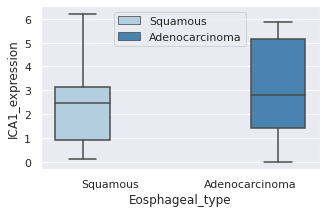

In [58]:
# filter by high adeno genes
#source = sns_box_df.loc[sns_box_df['variable'].isin(df['Gene'][:10])]

# change figure size
sns.set(rc={'figure.figsize':(5,3)})
sns_box = sns.boxplot(x='Eosphageal_type', y='ICA1_expression', hue='Eosphageal_type', data=CRISPR_esoph, palette="Blues")
sns_box.legend(loc='upper center')
#sns_box.set_title('High Adeno, Low Squamo Genes')

# Visualizing PCA with highlights

In [59]:
ICA1_CRISPR_corr_spread.dropna(inplace=True)
ICA1_CRISPR_corr_spread

,Gene,Correlation,St Dev,abs_corr
0,RPS2 (6187),0.638469,0.180765,0.638469
0,SYS1 (90196),0.599763,0.200119,0.599763
0,NFU1 (27247),0.592016,0.203992,0.592016
0,PPA1 (5464),0.586053,0.206973,0.586053
0,PDCD2 (5134),0.564912,0.217544,0.564912
...,...,...,...,...
0,MTHFD1 (4522),-0.56489,0.782445,0.56489
0,AP2M1 (1173),-0.564941,0.782471,0.564941
0,CSF2RA (1438),-0.618739,0.80937,0.618739
0,ANAPC13 (25847),-0.626884,0.813442,0.626884


In [60]:
[print(i) for i in CRISPR_df.T.index if i.startswith('IFI16')]

IFI16 (3428)


[None]

In [61]:
# from notebook 2
# high in esophagus adenocarcinoma, low in esophagus squamous 
high_adeno = ['ICA1 (3382)', 'DDAH1 (23576)', 'PLEKHA6 (22874)', 'HNF1A (6927)', 'RAB20 (55647)', 'PRR15L (79170)', 'CLMN (79789)', 'GPR35 (2859)', 'SLC44A3 (126969)', 'GCC2 (9648)']
# low in esophagus adenocarcinoma, high in esophagus squamous 
low_adeno = ['EFS (10278)', 'FSCN1 (6624)', 'SNAI2 (6591)','MCC (4163)','FRMD6 (122786)','TP63 (8626)','ZNF385A (25946)','KCTD15 (79047)','IFI16 (3428)']

# from this notebook
# ICA1 correlation high
high_ICA1 = ['RPS2 (6187)','SYS1 (90196)','NFU1 (27247)','PPA1 (5464)','PDCD2 (5134)']
# ICA1 correlation low
low_ICA1 = ['PROX1 (5629)','ANAPC13 (25847)','CSF2RA (1438)','AP2M1 (1173','MTHFD1 (4522)']

sig_genes = high_adeno + low_adeno + high_ICA1 + low_ICA1

In [62]:
# 'TP73L' is in low_adeno but not crispr dataset
gene_check=[]
for gene in sig_genes:
  #[print(i) for i in CRISPR_df.T.index if i.startswith(gene)]
  gene_check.append([i for i in CRISPR_df.T.index if i.startswith(gene)])

gene_check

[['ICA1 (3382)'],
 ['DDAH1 (23576)'],
 ['PLEKHA6 (22874)'],
 ['HNF1A (6927)'],
 ['RAB20 (55647)'],
 ['PRR15L (79170)'],
 ['CLMN (79789)'],
 ['GPR35 (2859)'],
 ['SLC44A3 (126969)'],
 ['GCC2 (9648)'],
 ['EFS (10278)'],
 ['FSCN1 (6624)'],
 ['SNAI2 (6591)'],
 ['MCC (4163)'],
 ['FRMD6 (122786)'],
 ['TP63 (8626)'],
 ['ZNF385A (25946)'],
 ['KCTD15 (79047)'],
 ['IFI16 (3428)'],
 ['RPS2 (6187)'],
 ['SYS1 (90196)'],
 ['NFU1 (27247)'],
 ['PPA1 (5464)'],
 ['PDCD2 (5134)'],
 ['PROX1 (5629)'],
 ['ANAPC13 (25847)'],
 ['CSF2RA (1438)'],
 ['AP2M1 (1173)'],
 ['MTHFD1 (4522)']]

In [63]:
# however 'TP73' is present in crispr dataset
[print(i) for i in CRISPR_df.T.index if i.startswith('TP7')]

TP73 (7161)


[None]

In [64]:
def label_genes (row):
  if row.name in high_adeno:
    return 'High Adeno, Low Squamo Genes'
  if row.name in low_adeno:
    return 'Low Adeno, High Squamo Genes'
  if row.name in high_ICA1:
    return 'High ICA1 Correlation'
  if row.name in low_ICA1:
    return 'Low ICA1 Correlation'
  if row.name not in sig_genes:
    return 'Other'

In [65]:
# select rows for 25 to 50% dataset (list_25_50_percent)
pca25_50 = CRISPR_transpose.loc[list_25_50_percent].dropna()  #remove nan

X_pca25_50 = StandardScaler().fit(pca25_50).transform(pca25_50)

pca = PCA(n_components = 2, random_state=0).fit_transform(X_pca25_50)

print(X_pca25_50.shape)

pcaDf = pd.DataFrame(data = pca, index=pca25_50.index ,columns = ['pc 1', 'pc 2'])

pcaDf.head()


(139, 992)


,pc 1,pc 2
ACTR1A (10121),6.735635,17.665292
ADSL (158),8.950649,-30.654938
AHCTF1 (25909),-0.792845,-0.374585
AK6 (102157402),-2.660893,4.158015
ALG14 (199857),-7.842208,0.383535


In [66]:
pcaDf['label'] = pcaDf.apply(lambda row: label_genes(row), axis=1)

In [67]:
pcaDf.head()

,pc 1,pc 2,label
ACTR1A (10121),6.735635,17.665292,Other
ADSL (158),8.950649,-30.654938,Other
AHCTF1 (25909),-0.792845,-0.374585,Other
AK6 (102157402),-2.660893,4.158015,Other
ALG14 (199857),-7.842208,0.383535,Other


In [68]:
pcaDf['label'].unique()

array(['Other', 'High ICA1 Correlation'], dtype=object)

In [69]:
# visualize
selection = alt.selection_multi(fields=['label'],bind='legend')
sort_order = ['Other','High ICA1 Correlation','Low ICA1 Correlation','High Adeno, Low Squamo Genes','Low Adeno, High Squamo Genes']
Hchart25_50 = alt.Chart(pcaDf.reset_index()).mark_circle().encode(
    x='pc 1',
    y='pc 2',
    color=alt.Color('label',#sort='descending'
                    sort=sort_order),
    tooltip=['index','pc 1', 'pc 2','label'],
    opacity=alt.condition(selection, alt.value(0.7), alt.value(0.05)),
).properties(title='25 to 50% dataset').interactive().add_selection(selection)

Hchart25_50

alt.Chart(...)

In [70]:
# select rows
pca25 = CRISPR_transpose.loc[list_25_percent].dropna()  #remove nan

X_pca25 = StandardScaler().fit(pca25).transform(pca25)

pca25data = PCA(n_components = 2, random_state=0).fit_transform(X_pca25)

pca25Df = pd.DataFrame(data = pca25data, index=pca25.index ,columns = ['pc 1', 'pc 2'])

pca25Df['label'] = pca25Df.apply(lambda row: label_genes(row), axis=1)

Hchart25 = alt.Chart(pca25Df.reset_index()).mark_circle().encode(
    x='pc 1',
    y='pc 2',
    color=alt.Color('label',sort=sort_order),
    tooltip=['index','pc 1', 'pc 2','label'],
    opacity=alt.condition(selection, alt.value(0.7), alt.value(0.05)),
).properties(title='25% dataset').interactive().add_selection(selection)

Hchart25

alt.Chart(...)

In [71]:
# select rows
pca5_25 = CRISPR_transpose.loc[list_5_25_percent].dropna()  #remove nan

X_pca5_25 = StandardScaler().fit(pca5_25).transform(pca5_25)

pca5_25data = PCA(n_components = 2, random_state=0).fit_transform(X_pca5_25)

pca5_25Df = pd.DataFrame(data = pca5_25data, index=pca5_25.index ,columns = ['pc 1', 'pc 2'])

pca5_25Df['label'] = pca5_25Df.apply(lambda row: label_genes(row), axis=1)

Hchart5_25 = alt.Chart(pca5_25Df.reset_index()).mark_circle().encode(
    x='pc 1',
    y='pc 2',
    color=alt.Color('label',sort=sort_order),
    tooltip=['index','pc 1', 'pc 2','label'],
    opacity=alt.condition(selection, alt.value(0.7), alt.value(0.05)),
).properties(title='5-25% dataset').interactive().add_selection(selection)

Hchart5_25

alt.Chart(...)

In [72]:
# select rows
pca50 = CRISPR_transpose.loc[list_50_percent].dropna()  #remove nan

X_pca50 = StandardScaler().fit(pca50).transform(pca50)

pca50data = PCA(n_components = 2, random_state=0).fit_transform(X_pca50)

pca50Df = pd.DataFrame(data = pca50data, index=pca50.index ,columns = ['pc 1', 'pc 2'])

pca50Df['label'] = pca50Df.apply(lambda row: label_genes(row), axis=1)
Hchart50 = alt.Chart(pca50Df.reset_index()).mark_circle().encode(
    x='pc 1',
    y='pc 2',
    color=alt.Color('label',sort=sort_order),
    tooltip=['index','pc 1', 'pc 2','label'],
    opacity=alt.condition(selection, alt.value(0.7), alt.value(0.05)),
).properties(title='50% dataset').interactive().add_selection(selection)

Hchart50

alt.Chart(...)

In [73]:
# select rows
pca75 = CRISPR_transpose.loc[list_75_percent].dropna()  #remove nan

X_pca75 = StandardScaler().fit(pca75).transform(pca75)

pca75data = PCA(n_components = 2, random_state=0).fit_transform(X_pca75)

pca75Df = pd.DataFrame(data = pca75data, index=pca75.index ,columns = ['pc 1', 'pc 2'])

pca75Df['label'] = pca75Df.apply(lambda row: label_genes(row), axis=1)
Hchart75 = alt.Chart(pca75Df.reset_index()).mark_circle().encode(
    x='pc 1',
    y='pc 2',
    color=alt.Color('label',sort=sort_order),
    tooltip=['index','pc 1', 'pc 2','label'],
    opacity=alt.condition(selection, alt.value(0.7), alt.value(0.05)),
).properties(title='75% dataset').interactive().add_selection(selection)

Hchart75

alt.Chart(...)

In [74]:
CRISPR_transpose.head()

DepMap_ID,ACH-000001,ACH-000004,ACH-000005,ACH-000007,ACH-000009,ACH-000011,ACH-000012,ACH-000013,ACH-000014,ACH-000015,ACH-000017,ACH-000018,ACH-000019,ACH-000021,ACH-000022,ACH-000023,ACH-000024,ACH-000025,ACH-000028,ACH-000029,ACH-000030,ACH-000035,ACH-000036,ACH-000037,ACH-000039,ACH-000040,ACH-000041,ACH-000042,ACH-000045,ACH-000047,ACH-000048,ACH-000052,ACH-000053,ACH-000054,ACH-000055,ACH-000060,ACH-000067,ACH-000070,ACH-000074,ACH-000075,...,ACH-002234,ACH-002239,ACH-002243,ACH-002247,ACH-002249,ACH-002250,ACH-002251,ACH-002257,ACH-002261,ACH-002263,ACH-002265,ACH-002269,ACH-002278,ACH-002280,ACH-002282,ACH-002283,ACH-002284,ACH-002285,ACH-002294,ACH-002295,ACH-002296,ACH-002297,ACH-002298,ACH-002304,ACH-002305,ACH-002315,ACH-002399,ACH-002446,ACH-002458,ACH-002459,ACH-002460,ACH-002462,ACH-002463,ACH-002464,ACH-002467,ACH-002508,ACH-002510,ACH-002512,max,min
A1BG (1),-0.334969,0.020107,-0.191303,0.008862,0.006476,0.144966,-0.135015,-0.093118,0.009573,-0.233304,0.045621,-0.150250,-0.084948,-0.144632,-0.123348,-0.134909,0.007880,-0.135757,-0.214794,-0.098954,-0.012566,-0.077951,-0.034852,-0.058340,-0.041640,-0.029223,-0.094291,-0.008927,-0.034514,-0.170074,-0.007964,-0.087994,0.082023,-0.193171,0.111758,-0.033703,0.049506,-0.086552,-0.148488,-0.042857,...,0.005670,-0.040777,-0.012995,-0.188624,-0.059027,-0.046560,0.073922,0.038355,-0.124916,-0.063623,0.028468,0.144020,0.189422,0.037447,-0.137368,-0.168436,-0.059204,-0.095606,0.011022,-0.057317,-0.167030,0.087860,-0.198959,0.021675,0.066203,0.078557,0.197422,-0.218523,-0.164574,-0.114961,-0.070382,-0.055249,0.012528,-0.113886,-0.140471,-0.079950,0.005493,-0.004693,0.372360,-0.429579
A1CF (29974),-0.061580,-0.000410,0.086000,-0.021161,-0.026033,-0.104504,0.118439,-0.052005,-0.153536,-0.080814,0.000240,-0.020622,0.010970,-0.072462,0.049656,-0.107933,-0.001918,-0.211275,-0.181650,0.017406,-0.351064,-0.006960,-0.066619,0.100857,0.152603,-0.095646,0.080225,-0.043387,0.086659,0.230689,-0.112457,-0.058201,0.029688,-0.052326,0.086416,0.059892,-0.217946,-0.106175,0.031065,0.037965,...,0.150086,-0.034703,0.025701,-0.199867,-0.095777,-0.058975,-0.091646,-0.077174,-0.001281,0.036452,0.071694,-0.060662,-0.039074,-0.000837,0.035301,0.068619,-0.074285,0.028372,-0.221683,0.041222,0.023609,-0.202574,0.175387,0.105074,-0.074744,-0.226371,0.031493,-0.312816,0.164348,-0.054229,-0.148926,-0.064067,0.064360,0.008348,0.123300,0.069270,0.012978,0.014939,0.553409,-0.864432
A2M (2),-0.026897,-0.055257,0.235074,0.102202,0.116825,0.121287,0.253352,0.093733,0.137888,-0.045071,0.041978,-0.181914,0.174494,0.017991,0.223375,0.053574,0.058593,0.050872,0.192795,0.125675,0.163411,0.055804,0.041389,0.054127,0.128234,-0.024763,0.218959,0.131296,0.083742,-0.000370,0.123808,0.183605,0.105163,0.036301,0.130973,-0.038505,0.062871,0.150198,0.270511,0.236993,...,-0.035864,-0.016141,0.022815,-0.038249,0.122463,0.078437,0.134116,0.097931,0.173613,0.015996,0.180041,0.197261,0.055410,0.079493,0.139364,0.197840,0.187001,0.110241,0.070967,0.238726,-0.011548,0.061205,-0.000719,0.113425,0.049077,0.083538,0.015363,0.046853,0.124925,0.199990,-0.071168,0.039575,0.026830,0.080286,0.169631,0.177966,0.038273,0.224676,0.455000,-0.316310
A2ML1 (144568),-0.026507,-0.071736,0.068524,0.107526,0.196238,0.340482,0.284129,0.175221,0.118795,0.076349,0.023405,0.119003,0.184318,-0.008290,-0.076456,-0.154982,0.118093,0.190053,0.242694,0.187836,0.167104,0.072329,0.268044,0.099115,0.469084,-0.074614,-0.138626,0.169394,0.134029,0.354782,0.033722,0.127489,0.082431,0.035399,0.103855,0.070583,0.154244,0.261595,0.255401,0.107239,...,-0.005725,0.114719,0.181945,0.165169,0.151168,0.201949,0.089478,-0.105688,0.157911,0.037526,0.297740,0.183246,0.054186,0.002799,0.111959,0.207893,0.184432,0.023725,0.244296,0.151469,0.046338,0.155546,0.123630,0.100842,0.006818,0.122887,-0.006871,0.120893,0.244009,0.226472,0.105607,0.175997,-0.101228,0.110665,0.041703,0.122893,0.016146,0.048566,0.469084,-0.270329
A3GALT2 (127550),-0.129643,-0.088479,-0.286711,-0.04555

In [75]:
CRISPR_PCA_df = CRISPR_transpose.dropna()

X_CRISPR = StandardScaler().fit(CRISPR_PCA_df).transform(CRISPR_PCA_df)

pcaCRISPR = PCA(n_components = 2, random_state=0).fit_transform(X_CRISPR)
print(X_CRISPR.shape)

pcaCRISPR = pd.DataFrame(data = pcaCRISPR, index=CRISPR_PCA_df.index ,columns = ['pc 1', 'pc 2'])
print(pcaCRISPR.shape)
pcaCRISPR['label'] = pcaCRISPR.apply(lambda row: label_genes(row), axis=1)

#plt.scatter(pcaCRISPR[['pc 1']], pcaCRISPR['pc 2'])

(15720, 992)
(15720, 2)


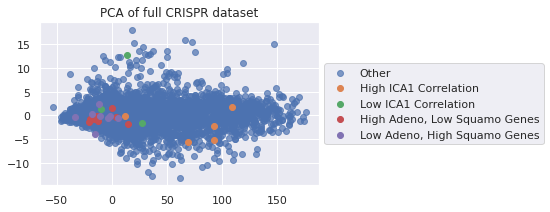

In [76]:
labels = ['Other','High ICA1 Correlation','Low ICA1 Correlation','High Adeno, Low Squamo Genes','Low Adeno, High Squamo Genes']
plt.scatter(pcaCRISPR.loc[pcaCRISPR['label'] == 'Other',['pc 1']], pcaCRISPR.loc[pcaCRISPR['label'] == 'Other',['pc 2']], alpha=0.7)
plt.scatter(pcaCRISPR.loc[pcaCRISPR['label'] == 'High ICA1 Correlation',['pc 1']], pcaCRISPR.loc[pcaCRISPR['label'] == 'High ICA1 Correlation',['pc 2']])
plt.scatter(pcaCRISPR.loc[pcaCRISPR['label'] == 'Low ICA1 Correlation',['pc 1']], pcaCRISPR.loc[pcaCRISPR['label'] == 'Low ICA1 Correlation',['pc 2']])
plt.scatter(pcaCRISPR.loc[pcaCRISPR['label'] == 'High Adeno, Low Squamo Genes',['pc 1']], pcaCRISPR.loc[pcaCRISPR['label'] == 'High Adeno, Low Squamo Genes',['pc 2']])
plt.scatter(pcaCRISPR.loc[pcaCRISPR['label'] == 'Low Adeno, High Squamo Genes',['pc 1']], pcaCRISPR.loc[pcaCRISPR['label'] == 'Low Adeno, High Squamo Genes',['pc 2']])
plt.legend(labels, loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('PCA of full CRISPR dataset')
plt.show()

All highlight visualizations

In [77]:
# Click legend to select by label
(Hchart5_25 & Hchart25_50 | Hchart25 & Hchart50 & Hchart75).configure_range(
    category={'scheme': 'category10'}
)

alt.HConcatChart(...)

In [78]:
(Hchart25 & Hchart5_25 | Hchart50 & Hchart25_50 | Hchart75).configure_range(
    category={'scheme': 'category10'}
).configure_legend(
  orient='bottom'
)

alt.HConcatChart(...)